# Notes

- Performed Exploratory Data Analysis
- Identified the need for data preprocessing
- Preprocessed the data with RobustScaler (outliers) and then scaled and normalized using StandardScaler and MinMaxScaler
- Applied resampling technique to benefit the models on the imbalanced dataset
- Used SelectFromModel and Filter Methods for feature selection
- Developed different models and evaluated their performance using different metrics and confusion matrix
- The simpler model turned out to be more efficient (training time and metrics)

<b> Comments <b>
- Main hardship was the dimensionality of the dataset, too many features. However, further analysis reveals that most of them were descriptive statistics of a fewer set of features
- Due to the ammount of features and level of abstraction on their meaning EDA was impacted slightly in comparison to other notebooks

## Importing the Data

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
rt_iot2022 = fetch_ucirepo(id=942) 
  
# data (as pandas dataframes) 
X = rt_iot2022.data.features 
y = rt_iot2022.data.targets

In [4]:
rt_iot2022.metadata

{'uci_id': 942,
 'name': 'RT-IoT2022 ',
 'repository_url': 'https://archive.ics.uci.edu/dataset/942/rt-iot2022',
 'data_url': 'https://archive.ics.uci.edu/static/public/942/data.csv',
 'abstract': 'The RT-IoT2022, a proprietary dataset derived from a real-time IoT infrastructure, is introduced as a comprehensive resource integrating a diverse range of IoT devices and sophisticated network attack methodologies. This dataset encompasses both normal and adversarial network behaviours, providing a general representation of real-world scenarios.\nIncorporating data from IoT devices such as ThingSpeak-LED, Wipro-Bulb, and MQTT-Temp, as well as simulated attack scenarios involving Brute-Force SSH attacks, DDoS attacks using Hping and Slowloris, and Nmap patterns, RT-IoT2022 offers a detailed perspective on the complex nature of network traffic. The bidirectional attributes of network traffic are meticulously captured using the Zeek network monitoring tool and the Flowmeter plugin. Researchers

In [5]:
rt_iot2022.variables

,name,role,type,demographic,description,units,missing_values
0,id.orig_p,Feature,Integer,None,None,None,no
1,id.resp_p,Feature,Integer,None,None,None,no
2,proto,Feature,Categorical,None,None,None,no
3,service,Feature,Continuous,None,None,None,no
4,flow_duration,Feature,Continuous,None,None,None,no
...,...,...,...,...,...,...,...
80,fwd_init_window_size,Feature,Integer,None,None,None,no
81,bwd_init_window_size,Feature,Integer,None,None,None,no
82,fwd_last_window_size,Feature,Integer,None,None,None,no
83,Attack_type,Target,Categorical,None,None,None,no


In [6]:
data = pd.concat((X,y), axis=1)

# EDA

In [8]:
data = data.drop(columns = ["id.orig_p", "id.resp_p"])

In [9]:
data["Attack_type"].value_counts()

Attack_type
DOS_SYN_Hping                 94659
Thing_Speak                    8108
ARP_poisioning                 7750
MQTT_Publish                   4146
NMAP_UDP_SCAN                  2590
NMAP_XMAS_TREE_SCAN            2010
NMAP_OS_DETECTION              2000
NMAP_TCP_scan                  1002
DDOS_Slowloris                  534
Wipro_bulb                      253
Metasploit_Brute_Force_SSH       37
NMAP_FIN_SCAN                    28
Name: count, dtype: int64

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 123117 entries, 0 to 123116
Data columns (total 82 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   proto                     123117 non-null  object 
 1   service                   123117 non-null  object 
 2   flow_duration             123117 non-null  float64
 3   fwd_pkts_tot              123117 non-null  int64  
 4   bwd_pkts_tot              123117 non-null  int64  
 5   fwd_data_pkts_tot         123117 non-null  int64  
 6   bwd_data_pkts_tot         123117 non-null  int64  
 7   fwd_pkts_per_sec          123117 non-null  float64
 8   bwd_pkts_per_sec          123117 non-null  float64
 9   flow_pkts_per_sec         123117 non-null  float64
 10  down_up_ratio             123117 non-null  float64
 11  fwd_header_size_tot       123117 non-null  int64  
 12  fwd_header_size_min       123117 non-null  int64  
 13  fwd_header_size_max       123117 non-null  i

In [11]:
data["proto"].value_counts()

proto
tcp     110427
udp      12633
icmp        57
Name: count, dtype: int64

In [12]:
data["service"].value_counts()

service
-         102861
dns         9753
mqtt        4132
http        3464
ssl         2663
ntp          121
dhcp          50
irc           43
ssh           28
radius         2
Name: count, dtype: int64

might be prefereble to remove some of these values, if not the entire columns since they have too many different values, we are already dealing with a lot of columns.

My idea is to focus on fewer categories and along the EDA see if they could be influencing different distributions in data

In [14]:
data = data[data['proto'] != "icmp"]

In [15]:
data = data[(data['service'] != "radius") & (data['service'] != "ssh") & (data['service'] != "irc") & (data['service'] != "dhcp") & (data['service'] != "ntp")]

In [16]:
_ = []
for col in data.columns:
    i = [col,len(data[col].value_counts()), data[col].unique()]
    _.append(i)
value_counts_df = pd.DataFrame(_)

In [17]:
pd.options.display.max_rows = 84
value_counts_df.sort_values(by = 1)

,0,1,2
24,bwd_URG_flag_count,1,[0]
0,proto,2,"[tcp, udp]"
23,fwd_URG_flag_count,2,"[0, 1]"
1,service,5,"[mqtt, -, http, dns, ssl]"
26,flow_ECE_flag_count,5,"[0, 1, 2, 3, 4]"
25,flow_CWR_flag_count,5,"[0, 2, 3, 4, 1]"
15,bwd_header_size_min,7,"[32, 0, 20, 40, 8, 24, 36]"
12,fwd_header_size_min,7,"[32, 20, 40, 8, 44, 0, 24]"
18,flow_SYN_flag_count,8,"[2, 4, 0, 3, 1, 8, 5, 6]"
13,fwd_header_size_max,8,"[40, 44, 32, 20, 52, 8, 24, 0]"


In [18]:
data = data.drop(columns = "bwd_URG_flag_count")

In [19]:
pd.options.display.max_columns = 82
data.describe()

,flow_duration,fwd_pkts_tot,bwd_pkts_tot,fwd_data_pkts_tot,bwd_data_pkts_tot,fwd_pkts_per_sec,bwd_pkts_per_sec,flow_pkts_per_sec,down_up_ratio,fwd_header_size_tot,fwd_header_size_min,fwd_header_size_max,bwd_header_size_tot,bwd_header_size_min,bwd_header_size_max,flow_FIN_flag_count,flow_SYN_flag_count,flow_RST_flag_count,fwd_PSH_flag_count,bwd_PSH_flag_count,flow_ACK_flag_count,fwd_URG_flag_count,flow_CWR_flag_count,flow_ECE_flag_count,fwd_pkts_payload.min,fwd_pkts_payload.max,fwd_pkts_payload.tot,fwd_pkts_payload.avg,fwd_pkts_payload.std,bwd_pkts_payload.min,bwd_pkts_payload.max,bwd_pkts_payload.tot,bwd_pkts_payload.avg,bwd_pkts_payload.std,flow_pkts_payload.min,flow_pkts_payload.max,flow_pkts_payload.tot,flow_pkts_payload.avg,flow_pkts_payload.std,fwd_iat.min,fwd_iat.max,fwd_iat.tot,fwd_iat.avg,fwd_iat.std,bwd_iat.min,bwd_iat.max,bwd_iat.tot,bwd_iat.avg,bwd_iat.std,flow_iat.min,flow_iat.max,flow_iat.tot,flow_iat.avg,flow_iat.std,payload_bytes_per_second,fwd_subflow_pkts,bwd_subflow_pkts,fwd_subflow_bytes,bwd_subflow_bytes,fwd_bulk_bytes,bwd_bulk_bytes,fwd_bulk_packets,bwd_bulk_packets,fwd_bulk_rate,bwd_bulk_rate,active.min,active.max,active.tot,active.avg,active.std,idle.min,idle.max,idle.tot,idle.avg,idle.std,fwd_init_window_size,bwd_init_window_size,fwd_last_window_size
count,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,1.228160e+05,1.228160e+05,1.228160e+05,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,122816.000000,1.228160e+05,122816.000000,122816.000000,122816.000000,122816.000000,1.228160e+05,122816.000000,122816.000000,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,122816.000000,122816.000000,122816.000000,1.228160e+05,122816.000000,1.228160e+05,122816.000000,122816.000000,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,1.228160e+05,122816.000000,122816.000000,122816.000000
mean,3.747895,2.240767,1.900436,1.451521,0.814552,3.526674e+05,3.526231e+05,7.052905e+05,0.855256,53.513418,19.800873,20.660207,46.447955,17.715021,18.450397,0.114741,0.951887,0.798381,0.346779,0.388777,2.657512,0.016333,0.000847,0.000537,96.397383,120.711186,220.593897,100.648151,8.065518,3.641179,52.040646,5.130861e+02,18.608786,20.519954,13.359733,148.328101,7.336800e+02,64.908220,76.154465,7.235656e+03,1.718858e+06,3.735989e+06,2.349628e+05,5.771782e+05,2.992372e+03,4.023752e+05,1.742937e+06,8.510236e+04,1.460484e+05,2.059935e+03,1.720703e+06,3.748877e+06,1.357246e+05,4.489278e+05,4.115405e+07,1.550970,1.337417,136.530712,2.176045e+02,19.282441,1.556141e+02,0.023818,0.131434,3.845141e+03,4.853326e+04,1.295333e+05,1.620911e+05,2.686656e+05,1.398881e+05,1.655583e+04,1.615361e+06,1.697297e+06,3.480211e+06,1.662061e+06,4.421361e+04,6096.310880,2730.102853,730.964117
std,130.050568,22.058377,33.053938,19.323788,32.331907,3.708098e+05,3.708468e+05,7.416540e+05,0.337019,392.108472,5.320100,7.194702,1029.414393,7.984715,9.393089,0.473377,0.471478,0.435765,3.947383,6.006702,41.684933,0.126755,0.042889,0.028814,45.128238,120.933018,4823.544066,45.980271,44.991853,17.767282,230.924130,4.249336e+04,83.179883,93.412515,34.451992,217.910937,4.301825e+04,49.879661,73.989781,1.213807e+06,9.234828e+06,1.300459e+08,1.885231e+06,3.207464e+06,1.500630e+05,4.274163e+06,9.126503e+07,1.070549e+06,1.783356e+06,7.172015e+04,9.249140e+06,1.300508e+08,8.157380e+05,2.505657e+06,4.486589e+07,2.716584,6.013399,429.289764,7.590013e+03,1977.034113,1.961695e+04,1.484740,14.564359,3.084106e+05,6.860830e+05,5.385634e+05,7.668934e+05,1.401202e+07

In [20]:
data.skew(numeric_only=True)

flow_duration               121.124696
fwd_pkts_tot                125.328128
bwd_pkts_tot                249.713097
fwd_data_pkts_tot           165.096117
bwd_data_pkts_tot           263.747139
fwd_pkts_per_sec              0.991636
bwd_pkts_per_sec              0.991426
flow_pkts_per_sec             0.991552
down_up_ratio                -1.824684
fwd_header_size_tot         100.413028
fwd_header_size_min           0.231573
fwd_header_size_max           1.273527
bwd_header_size_tot         268.804638
bwd_header_size_min          -1.001070
bwd_header_size_max          -0.033044
flow_FIN_flag_count           5.160503
flow_SYN_flag_count          -0.035334
flow_RST_flag_count          -0.601155
fwd_PSH_flag_count          120.714307
bwd_PSH_flag_count          148.705652
flow_ACK_flag_count         214.267057
fwd_URG_flag_count            7.631668
flow_CWR_flag_count          54.023079
flow_ECE_flag_count          69.380769
fwd_pkts_payload.min         -1.152917
fwd_pkts_payload.max     

In [21]:
data_numeric = data.select_dtypes(include = "number")

In [22]:
data["Attack_type"].value_counts()

abbreviations = {
    "DOS_SYN_Hping": "DOS_H",
    "Thing_Speak": "TS",
    "ARP_poisoning": "ARP_P",
    "MQTT_Publish": "MQTT_P",
    "NMAP_UDP_SCAN": "NMAP_UDP",
    "NMAP_XMAS_TREE_SCAN": "NMAP_XMAS",
    "NMAP_OS_DETECTION": "NMAP_OS",
    "NMAP_TCP_scan": "NMAP_TCP",
    "DDOS_Slowloris": "DDOS_S",
    "Wipro_bulb": "WB",
    "NMAP_FIN_SCAN": "NMAP_FIN",
    "Metasploit_Brute_Force_SSH": "MBF_SSH"
}

# Replace the values in the column
data["Attack_type"] = data["Attack_type"].replace(abbreviations)

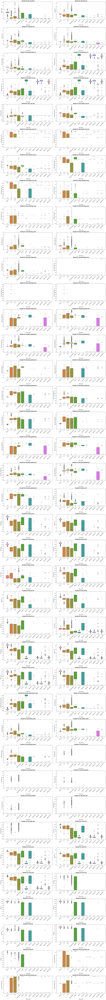

In [23]:
fig, axes = plt.subplots(42,2, figsize=(20,200), tight_layout = True)
axes = axes.flatten()

for col, ax in zip(data_numeric, axes):
    g = sns.boxplot(data = data_numeric, y = np.log1p(data_numeric[col]), x = data["Attack_type"], hue = data["Attack_type"], ax = ax, legend = False)
    ax.autoscale(enable=True)
    ax.tick_params("x", rotation=45)
    g.set_title(f"Boxplot for {col}", fontweight = "bold")

[fig.delaxes(ax) for ax in axes if not ax.has_data()]

plt.show()

In [24]:
data.select_dtypes(include="number").columns
data[data.select_dtypes(include="number").columns] = np.log1p(data.select_dtypes(include="number"))

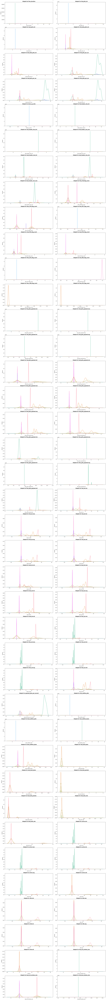

In [25]:
fig, axes = plt.subplots(42,2, figsize=(20,200), tight_layout = True)
axes = axes.flatten()


for col, ax in zip(data_numeric, axes):
    g = sns.kdeplot(data = data_numeric, x= np.log1p(data_numeric[col]), hue = data["Attack_type"], common_norm = True, ax = ax, legend = False, warn_singular = False)
    ax.autoscale(enable=True)
    g.set_title(f"Kdeplot for {col}", fontweight = "bold")
    handles, labels = ax.get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper center')

[fig.delaxes(ax) for ax in axes if not ax.has_data()]

plt.show()

In [26]:
tot_columns = [col for col in data.columns if '.tot' in col]
min_columns = [col for col in data.columns if '.min' in col]
max_columns = [col for col in data.columns if '.max' in col]
avg_columns = [col for col in data.columns if '.avg' in col]
count_columns = [col for col in data.columns if 'count' in col]
per_second_columns = [col for col in data.columns if 'per_sec' in col]
rate_columns = [col for col in data.columns if 'rate' in col]

In [27]:
len(avg_columns),len(count_columns),len(min_columns), len(max_columns), len(tot_columns)

(8, 9, 8, 8, 8)

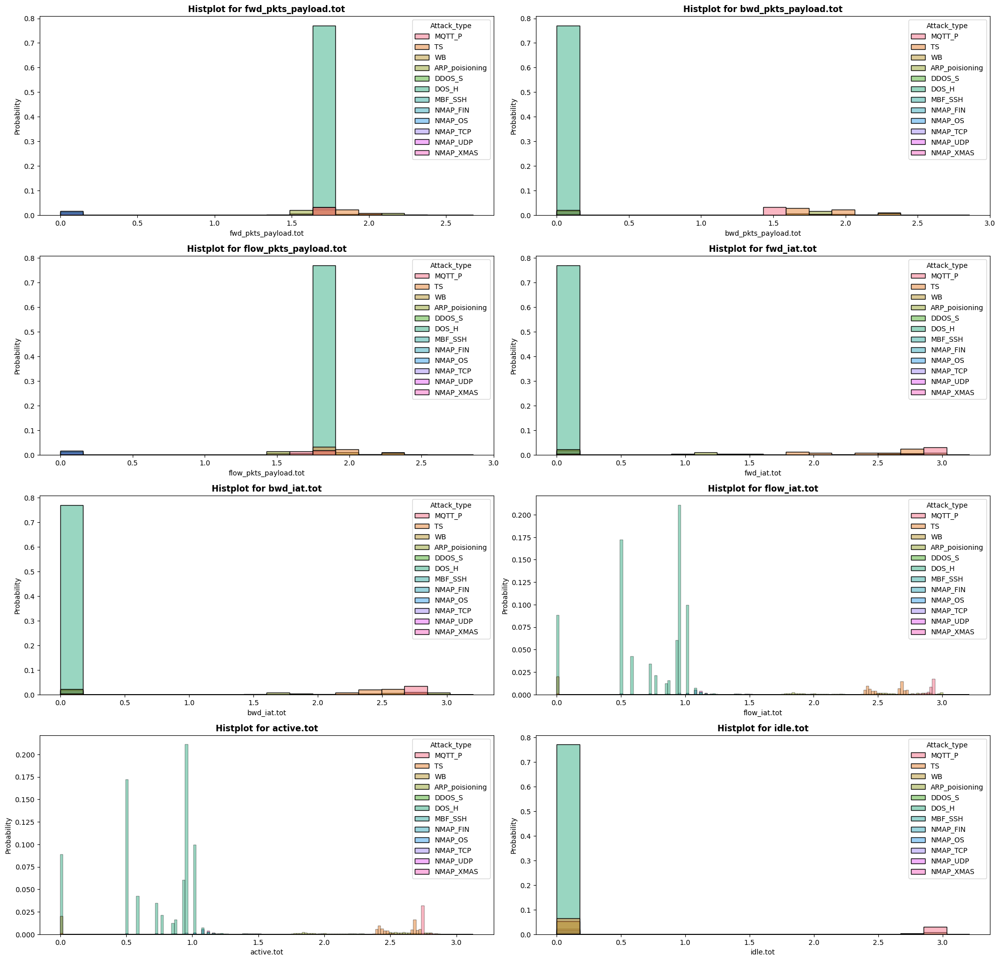

In [28]:

fig, axes = plt.subplots(42,2, figsize=(20,200), tight_layout = True)
axes = axes.flatten()

data_tot = data[tot_columns]
for col, ax in zip(data_tot, axes):
    g = sns.histplot(data = data_numeric, x= np.log1p(data_tot[col]), hue = data["Attack_type"], stat = "probability", common_norm = True, ax = ax, legend = True)
    ax.autoscale(enable=True)
    g.set_title(f"Histplot for {col}", fontweight = "bold")
   

[fig.delaxes(ax) for ax in axes if not ax.has_data()]

plt.show()

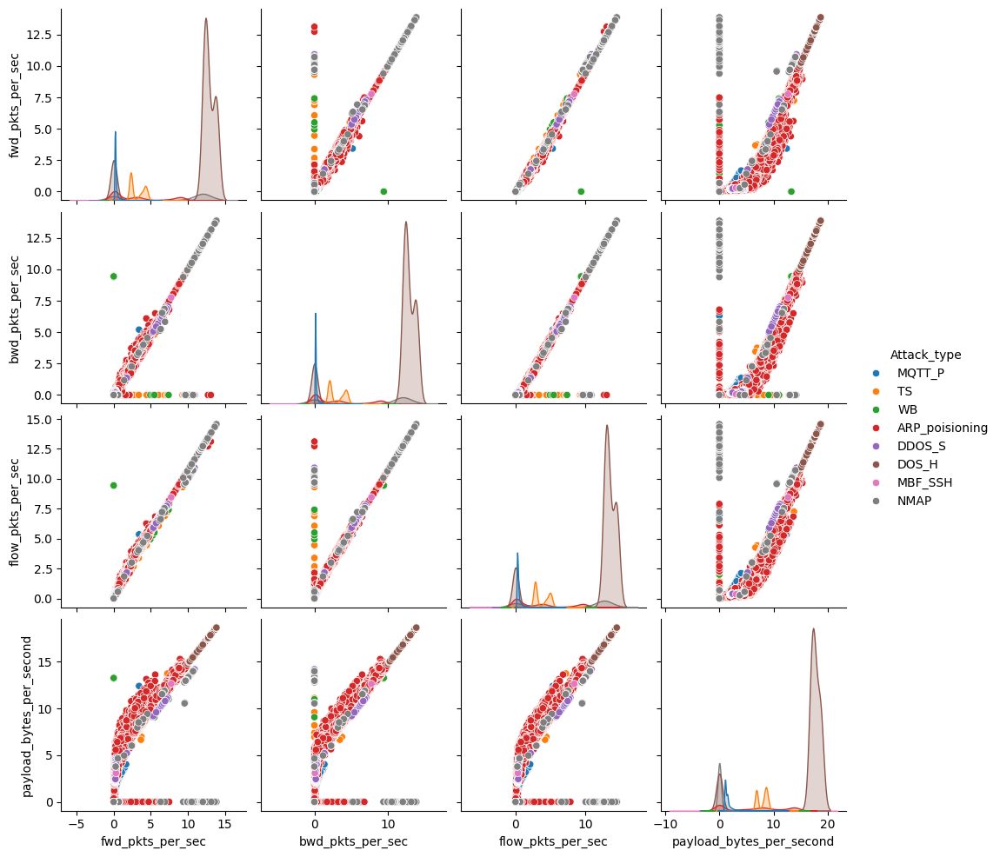

In [29]:
nmap_categories = [
    "NMAP_UDP", 
    "NMAP_XMAS", 
    "NMAP_OS", 
    "NMAP_TCP", 
    "NMAP_FIN"
]
data_ = data.copy()
data_["Attack_type"] = data["Attack_type"].replace(nmap_categories, "NMAP")


sns.pairplot(data = data_, x_vars = per_second_columns, y_vars = per_second_columns, hue="Attack_type")
plt.show()

In [30]:
mean_value = data[data['Attack_type'] == "WB"]["payload_bytes_per_second"].mean()

data.loc[
    (data['payload_bytes_per_second'] > 12) & (data['Attack_type'] == "WB"),
    'payload_bytes_per_second'
] = mean_value


mean_value = data[data['Attack_type'] == "WB"]["flow_pkts_per_sec"].mean()


data.loc[
    (data['payload_bytes_per_second'] > 12) & (data['Attack_type'] == "WB"),
    'flow_pkts_per_sec'
] = mean_value

mean_value = data[data['Attack_type'] == "WB"]["bwd_pkts_per_sec"].mean()


data.loc[
    (data['payload_bytes_per_second'] > 12) & (data['Attack_type'] == "WB"),
    'bwd_pkts_per_sec'
] = mean_value


Removed a few outliers present in the above features

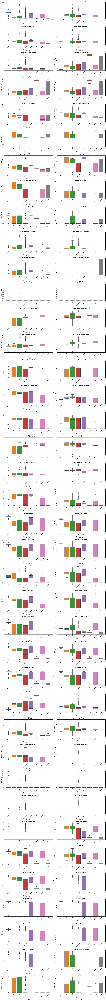

In [31]:
fig, axes = plt.subplots(42,2, figsize=(20,200), tight_layout = True)
axes = axes.flatten()

for col, ax in zip(data_numeric, axes):
    g = sns.boxplot(data = data_numeric, y = np.log1p(data_numeric[col]), x = data_["Attack_type"], hue = data_["Attack_type"], ax = ax, legend = False)
    ax.autoscale(enable=True)
    ax.tick_params("x", rotation=45)
    g.set_title(f"Boxplot for {col}", fontweight = "bold")
plt.suptitle("Boxplots for Attack Categories reduced and over features", fontweight = "bold")

[fig.delaxes(ax) for ax in axes if not ax.has_data()]

plt.show()

# Data Preprocessing

In [33]:
# Select only numerical features
X = data.select_dtypes(include="number")
y = data["Attack_type"]

In [34]:
X.skew(numeric_only = True)

flow_duration                4.452444
fwd_pkts_tot                 3.379350
bwd_pkts_tot                 2.398120
fwd_data_pkts_tot            3.188866
bwd_data_pkts_tot            3.348334
fwd_pkts_per_sec            -1.089770
bwd_pkts_per_sec            -1.078551
flow_pkts_per_sec           -1.112187
down_up_ratio               -2.070694
fwd_header_size_tot          2.785822
fwd_header_size_min         -1.548104
fwd_header_size_max         -0.708440
bwd_header_size_tot         -0.541618
bwd_header_size_min         -2.065146
bwd_header_size_max         -1.974624
flow_FIN_flag_count          3.872200
flow_SYN_flag_count         -1.213919
flow_RST_flag_count         -1.256242
fwd_PSH_flag_count           3.491227
bwd_PSH_flag_count           4.113807
flow_ACK_flag_count          2.478323
fwd_URG_flag_count           7.631668
flow_CWR_flag_count         50.712516
flow_ECE_flag_count         54.673585
fwd_pkts_payload.min        -1.948546
fwd_pkts_payload.max        -2.845067
fwd_pkts_pay

In [35]:
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test  = train_test_split(X, y, test_size=0.36, random_state=42, shuffle=True, stratify=y)

In [36]:
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler

norm = MinMaxScaler().set_output(transform = "pandas")
robust = RobustScaler().set_output(transform = "pandas")
standard = StandardScaler().set_output(transform = "pandas")


X_train = robust.fit_transform(X_train)
X_test = robust.transform(X_test)
X_train = standard.fit_transform(X_train)
X_test = standard.transform(X_test)
X_train = norm.fit_transform(X_train)
X_test = norm.transform(X_test)

In [37]:
from imblearn.over_sampling import SMOTE
from collections import Counter

# Before oversampling
print("Class distribution before oversampling:", Counter(y_train))

# Apply SMOTE to oversample the minority classes
smote = SMOTE(random_state=42)  # You can adjust `random_state` for reproducibility
X_train_resampled, y_train_resampled = smote.fit_resample(X_train, y_train)

# After oversampling
print("Class distribution after oversampling:", Counter(y_train_resampled))

Class distribution before oversampling: Counter({'DOS_H': 60582, 'TS': 5081, 'ARP_poisioning': 4934, 'MQTT_P': 2653, 'NMAP_UDP': 1651, 'NMAP_XMAS': 1286, 'NMAP_OS': 1280, 'NMAP_TCP': 641, 'DDOS_S': 340, 'WB': 130, 'NMAP_FIN': 18, 'MBF_SSH': 6})
Class distribution after oversampling: Counter({'DOS_H': 60582, 'NMAP_XMAS': 60582, 'TS': 60582, 'NMAP_TCP': 60582, 'ARP_poisioning': 60582, 'MQTT_P': 60582, 'NMAP_OS': 60582, 'NMAP_UDP': 60582, 'DDOS_S': 60582, 'MBF_SSH': 60582, 'WB': 60582, 'NMAP_FIN': 60582})


# Feature Selection

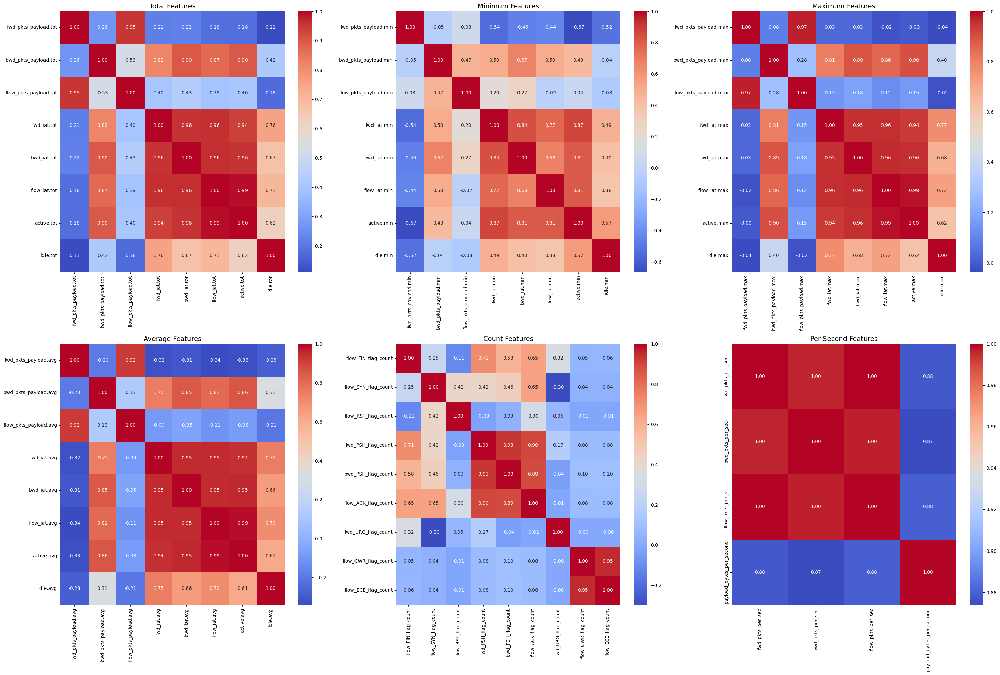

In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

# Lists of features
feature_lists = {
    "Total Features": tot_columns,
    "Minimum Features": min_columns,
    "Maximum Features": max_columns,
    "Average Features": avg_columns,
    "Count Features": count_columns,
    "Per Second Features": per_second_columns,
}

# Set up subplots
fig, axes = plt.subplots(2,3, figsize=(30, 20))
axes = axes.flatten()

# Plot heatmaps
for i, (title, feature) in enumerate(feature_lists.items()):
    # Compute correlations
    corr_matrix = data[feature].corr()
    
    # Create heatmap
    sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", ax=axes[i])
    axes[i].set_title(title, fontsize=14)

# Remove empty subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


In [40]:
data["Attack_type"].unique()

array(['MQTT_P', 'TS', 'WB', 'ARP_poisioning', 'DDOS_S', 'DOS_H',
       'MBF_SSH', 'NMAP_FIN', 'NMAP_OS', 'NMAP_TCP', 'NMAP_UDP',
       'NMAP_XMAS'], dtype=object)

In [41]:
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import LogisticRegression

In [ ]:
Selecting the features which provide an above average contribution to the classification

For the case of LogisticRegression the model considers the magnitude of the coeficients that adjust the decision boundary

In [42]:
selector = SelectFromModel(estimator=LogisticRegression(max_iter=1000)).fit(X, y.values.ravel())

selected_features = X.columns[selector.get_support(indices=True)]
selected_features_bool = selector.get_support(indices=False)

print("Selected Features:", selected_features)
print("Boolean Mask for Selected Features:", selected_features_bool)

Selected Features: Index(['fwd_pkts_tot', 'fwd_data_pkts_tot', 'fwd_pkts_per_sec',
       'bwd_pkts_per_sec', 'flow_pkts_per_sec', 'down_up_ratio',
       'fwd_header_size_tot', 'fwd_header_size_min', 'fwd_header_size_max',
       'bwd_header_size_max', 'flow_FIN_flag_count', 'flow_SYN_flag_count',
       'flow_RST_flag_count', 'fwd_PSH_flag_count', 'flow_ACK_flag_count',
       'fwd_URG_flag_count', 'fwd_pkts_payload.min', 'fwd_pkts_payload.tot',
       'bwd_pkts_payload.max', 'flow_pkts_payload.min',
       'flow_pkts_payload.max', 'flow_pkts_payload.tot',
       'flow_pkts_payload.avg', 'fwd_iat.max', 'fwd_iat.tot', 'flow_iat.min',
       'flow_iat.avg', 'payload_bytes_per_second', 'fwd_subflow_pkts',
       'fwd_subflow_bytes', 'fwd_init_window_size', 'fwd_last_window_size'],
      dtype='object')
Boolean Mask for Selected Features: [False  True False  True False  True  True  True  True  True  True  True
 False False  True  True  True  True  True False  True  True False False
  Tru

# Modelling

## CNN

In [45]:
import torch
import torch.nn as nn

Converting the data into a 2D shape for cnn model

### Brief data preprocessment and engineering

In [46]:
#tot_columns = [col for col in data.columns if '.tot' in col]
#min_columns = [col for col in data.columns if '.min' in col]
#max_columns = [col for col in data.columns if '.max' in col]
#avg_columns = [col for col in data.columns if '.avg' in col] there are subsets of the data with 8 features each

def reshape_to_cnn_input_4x4(data):
    num_samples = data.shape[0]

    def create_4x4_channel(features):
        """
        Helper function to create a 4x4 channel by computing pairwise interactions.
        Assumes 4 features horizontally and 4 vertically.
        """
        num_features = len(features)
        assert num_features == 8, "The feature list must have exactly 8 features."
        
        # Split features into 4 horizontal and 4 vertical
        horizontal_features = features[:4]
        vertical_features = features[4:]
        
        # Create the 4x4 grid using outer product (pairwise interactions)
        grid = np.zeros((num_samples, 4, 4))
        for i, h_feat in enumerate(horizontal_features):
            for j, v_feat in enumerate(vertical_features):
                grid[:, i, j] = data[h_feat].values * data[v_feat].values  # Example: Pairwise interaction
        
        return grid[..., np.newaxis]  # Add channel dimension

    # Create each channel
    min_channel = create_4x4_channel(min_columns)
    max_channel = create_4x4_channel(max_columns)
    avg_channel = create_4x4_channel(avg_columns)
    tot_channel = create_4x4_channel(tot_columns)

    # Combine channels into a single input tensor
    combined_data = np.concatenate([min_channel, max_channel, avg_channel, tot_channel], axis=-1)
    return combined_data

# Apply the function to training and test sets
X_train_reshaped = reshape_to_cnn_input_4x4(X_train)
X_test_reshaped = reshape_to_cnn_input_4x4(X_test)


In [47]:
from sklearn.preprocessing import LabelEncoder

label_encoder = LabelEncoder()

# Fit on training data and transform both train and test targets
y_train_encoded = label_encoder.fit_transform(y_train)
y_test_encoded = label_encoder.transform(y_test)

# Convert to PyTorch tensors
y_train_tensor = torch.tensor(y_train_encoded, dtype=torch.long)  # Use long for classification targets
y_test_tensor = torch.tensor(y_test_encoded, dtype=torch.long)
X_train_reshaped_tensor = torch.Tensor(X_train_reshaped)
X_test_reshaped_tensor = torch.Tensor(X_test_reshaped)

In [48]:
from torch.utils.data import DataLoader, TensorDataset

train_dataset = TensorDataset(X_train_reshaped_tensor, y_train_tensor)
test_dataset = TensorDataset(X_test_reshaped_tensor, y_test_tensor)

train_dataloader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=32, shuffle=False)

In [49]:
import torch.nn as nn

class CNNModel(nn.Module):
    def __init__(self, input_shape: int, hidden_layer1: int, hidden_layer2: int, output_shape: int):
        super(CNNModel, self).__init__()
        
        # Define the convolutional layers
        self.conv1 = nn.Conv2d(input_shape, hidden_layer1, kernel_size=3, stride=1, padding=1)
        self.bn1 = nn.BatchNorm2d(hidden_layer1)  # BatchNorm2d for conv1 output
        
        self.conv2 = nn.Conv2d(hidden_layer1, hidden_layer2, kernel_size=3, stride=1, padding=1)
        self.bn2 = nn.BatchNorm2d(hidden_layer2)  # BatchNorm2d for conv2 output
        
        # Flattened size = height * width * num_filters (hidden_layer2)
        self.flattened_size = 4 * 4 * hidden_layer2
        self.fc = nn.Linear(self.flattened_size, output_shape)

    def forward(self, x):
        # Pass through the first convolutional layer, batch norm, and activation
        x = nn.ReLU()(self.bn1(self.conv1(x)))
        
        # Pass through the second convolutional layer, batch norm, and activation
        x = nn.ReLU()(self.bn2(self.conv2(x)))
        
        # Flatten before passing to the fully connected layer
        x = nn.Flatten()(x)
        x = self.fc(x)
        return x


In [50]:
model = CNNModel(input_shape = 4, hidden_layer1 = 32, hidden_layer2 = 20, output_shape = 12)

In [51]:
dummy_input = torch.randn(1, 4, 4, 4)  # Batch size 1, 4 channels, 4x4 spatial dimensions
output = model(dummy_input)
print("Output Shape:", output.shape)

Output Shape: torch.Size([1, 12])


In [54]:
gradients = {name: [] for name, param in model.named_parameters() if param.requires_grad}
from sklearn.metrics import f1_score
def train_loop(dataloader, model, loss_fn, optimizer):
    size = len(dataloader.dataset)
    correct = 0  # For accuracy tracking
    total = 0
    model.train()
    batch_size = 32

    for batch, (X, y) in enumerate(dataloader):
        # Compute prediction and loss
        pred = model(X)
        loss = loss_fn(pred, y)

        # Backpropagation
        loss.backward()


        # Save gradients after backward pass
        for name, param in model.named_parameters():
            if param.grad is not None:
                # Save the mean of gradients for this batch
                gradients[name].append(param.grad.norm().item())  # Use .mean() or .norm() as needed

        # Update weights
        optimizer.step()
        optimizer.zero_grad()

        # Print progress
        if batch % 100 == 0:
            loss, current = loss.item(), batch * batch_size + len(X)
            print(f"loss: {loss:>7f}  [{current:>5d}/{size:>5d}]")
            
        # Calculate accuracy
        _, predicted = torch.max(pred, 1)
        correct += (predicted == y).sum().item()
        total += y.size(0)

    accuracy = correct / total * 100
    print(f"Train Accuracy: {accuracy:.4f}%")

def test_loop(dataloader, model, loss_fn):
    
    losses = []
    all_preds = []  # To store all predicted labels
    all_labels = []
    
    # Set the model to evaluation mode - important for batch normalization and dropout layers
    # Unnecessary in this situation but added for best practices
    model.eval()
    size = len(dataloader.dataset)
    num_batches = len(dataloader)
    test_loss, correct = 0, 0
    

    # Evaluating the model with torch.no_grad() ensures that no gradients are computed during test mode
    # also serves to reduce unnecessary gradient computations and memory usage for tensors with requires_grad=True
    with torch.no_grad():
        for X, y in dataloader:
            pred = model(X)
            test_loss += loss_fn(pred, y).item()
            correct += (pred.argmax(1) == y).type(torch.float).sum().item()

             # Collect predictions and true labels
            all_preds.extend(pred.argmax(1).cpu().numpy())  # Convert to numpy and store
            all_labels.extend(y.cpu().numpy())  # Convert to numpy and store
            f1 = f1_score(all_labels, all_preds, average='weighted')  # Compute weighted F1-score

    test_loss /= num_batches
    correct /= size
    print(f"Test Accuracy: {(100*correct):>0.4f}%, Avg loss: {test_loss:>8f} \n")
    print(f"F1-score: {100*f1:>0.4f}%\n")


In [56]:
loss_fn = nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters(), lr=0.00001)

epochs = 15
for t in range(epochs):
    print(f"Epoch {t+1}\n-------------------------------")
    train_loop(train_dataloader, model, loss_fn, optimizer)
    test_loop(test_dataloader, model, loss_fn)
print("Done!")

Epoch 1
-------------------------------
loss: 0.437014  [   32/78602]
loss: 0.686687  [ 3232/78602]
loss: 0.616815  [ 6432/78602]
loss: 0.386621  [ 9632/78602]
loss: 0.570560  [12832/78602]
loss: 0.338398  [16032/78602]
loss: 0.240409  [19232/78602]
loss: 0.802003  [22432/78602]
loss: 0.299738  [25632/78602]
loss: 0.597102  [28832/78602]
loss: 0.350366  [32032/78602]
loss: 0.545204  [35232/78602]
loss: 0.263785  [38432/78602]
loss: 0.234903  [41632/78602]
loss: 0.563354  [44832/78602]
loss: 0.450464  [48032/78602]
loss: 0.397492  [51232/78602]
loss: 0.274369  [54432/78602]
loss: 0.500658  [57632/78602]
loss: 0.485564  [60832/78602]
loss: 0.356813  [64032/78602]
loss: 0.297924  [67232/78602]
loss: 0.430854  [70432/78602]
loss: 0.313879  [73632/78602]
loss: 0.286139  [76832/78602]
Train Accuracy: 89.9074%
Test Accuracy: 90.3085%, Avg loss: 0.334568 

F1-score: 86.9308%

Epoch 2
-------------------------------
loss: 0.417452  [   32/78602]
loss: 0.252456  [ 3232/78602]
loss: 0.214454  [ 6

SGD takes longer to converge and for the initial loss to diminsh as well

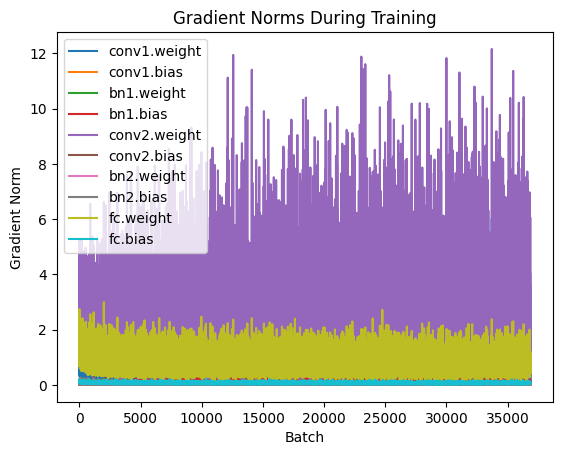

In [58]:
for name, grad_values in gradients.items():
    plt.plot(grad_values, label=name)

plt.xlabel('Batch')
plt.ylabel('Gradient Norm')
plt.title('Gradient Norms During Training')
plt.legend()
plt.show()

Since the training accuracy reported during the first epoch reflects performance across all batches, it includes results from earlier batches when the model was less trained. In contrast, the test accuracy reflects performance only after the entire training epoch, when the model has already improved significantly.

## Logistic Regression 

In [86]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, f1_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

In [88]:
model_lr = LogisticRegression(C = 0.3)

In [90]:
model_ = model_lr.fit(X_train_resampled[selected_features],y_train_resampled) #changed
y_pred = model_.predict(X_test[selected_features])
f1_score(y_test, y_pred, average = "weighted")

C:\Users\TESTER\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


0.9754340332161532

In [91]:
scores = cross_val_score(model_lr, X_train, y_train, cv=5, scoring="f1_weighted")
scores

C:\Users\TESTER\anaconda3\lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


array([0.98630617, 0.98396778, 0.98408357, 0.98341368, 0.98413032])

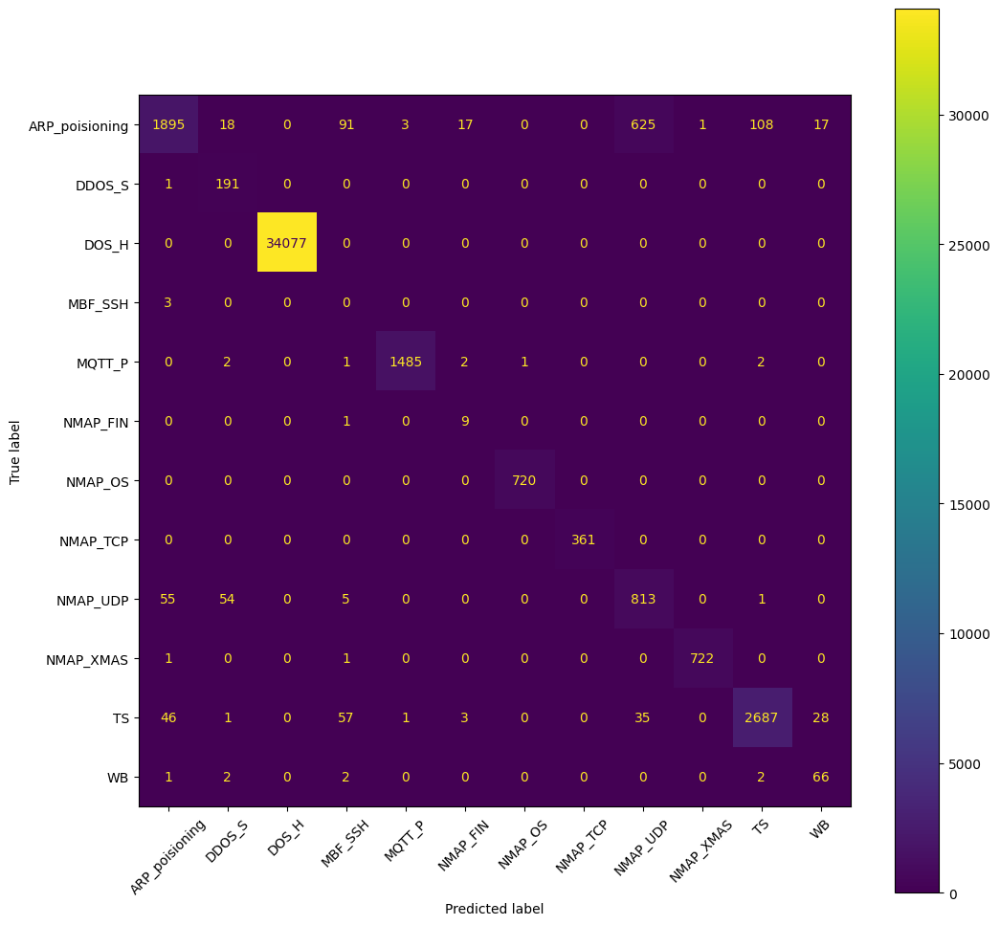

In [92]:
cm = confusion_matrix(y_test, y_pred, labels=model_lr.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model_lr.classes_)

fig, ax = plt.subplots(figsize=(12, 12)) 
disp.plot(cmap="viridis", ax=ax)  
ax.tick_params("x", rotation=45)
plt.show()

## Random Forrest

In [66]:
from sklearn.ensemble import RandomForestClassifier

In [67]:
model_rf = RandomForestClassifier(n_estimators=200,
    criterion='gini',
    max_depth=2,
    min_samples_split=2,
    min_samples_leaf=1,
    min_weight_fraction_leaf=0.0,
    max_features='sqrt',
    max_leaf_nodes=None,
    min_impurity_decrease=0.0,
    bootstrap=True,
    oob_score=False,
    n_jobs=None,
    random_state=None,
    verbose=0,
    warm_start=False,
    class_weight=None,
    ccp_alpha=0.0,
    max_samples=0.8,
    monotonic_cst=None)

In [68]:
model_ = model_rf.fit(X_train_resampled[selected_features],y_train_resampled) #changed
y_pred = model_.predict(X_test[selected_features])
f1_score(y_test, y_pred, average = "weighted")

0.8699460300648351

In [69]:
scores = cross_val_score(model_rf, X_train, y_train, cv=5, scoring="f1_weighted")

In [70]:
scores.mean()

0.8656322335595013

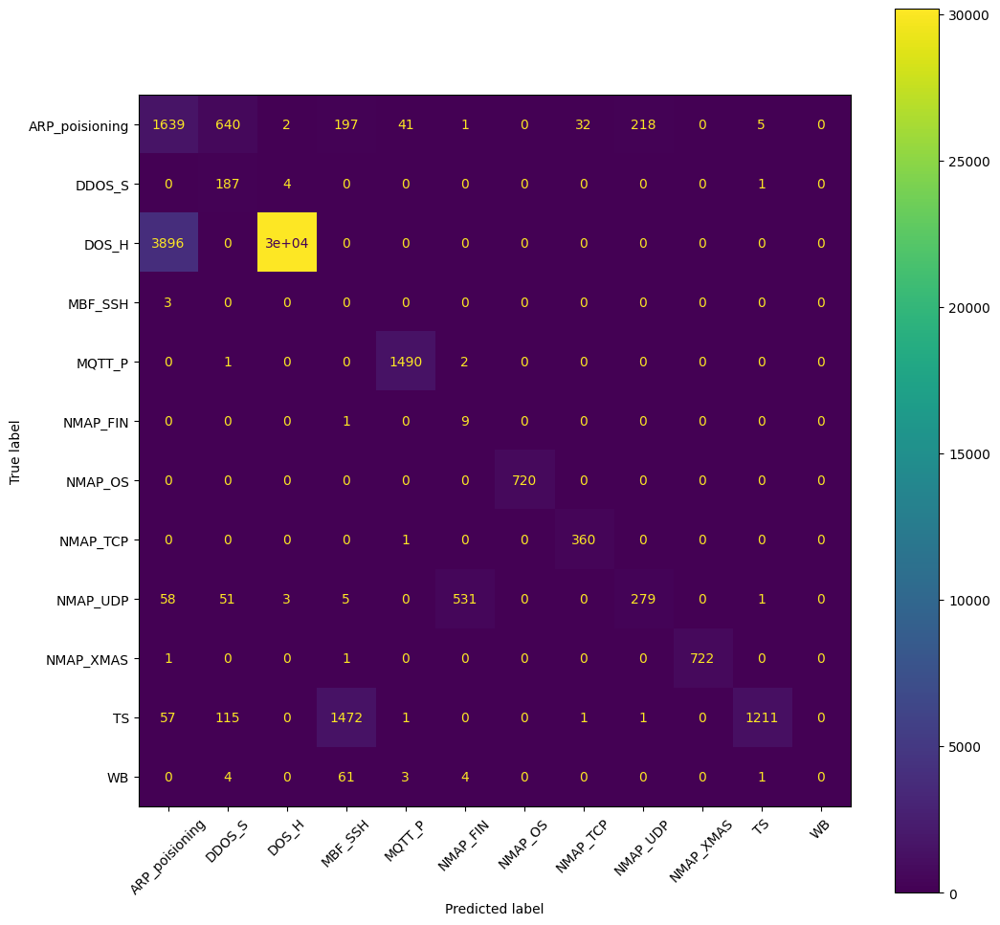

In [82]:
cm = confusion_matrix(y_test, y_pred, labels=model_rf.classes_)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=model_rf.classes_)

fig, ax = plt.subplots(figsize=(12, 12)) 
disp.plot(cmap="viridis", ax=ax)  
ax.tick_params("x", rotation=45)
plt.show()